In [1]:
using DSP, WAV, FFTW, Plots, Colors, ImageIO, FileIO, ImageShow, StatsBase;

In [2]:
function load_iq(fn)
	len = div(filesize(fn), sizeof(ComplexF32))
	z = Vector{ComplexF32}(undef,len)
	read!(fn, z)
end

load_iq (generic function with 1 method)

In [3]:
begin
	const Fs = 64_000_000
	const Fp = 25_175_000
	const Xt = 800
	const Yt = 525
	
	const SAMPLE_FACTOR = 1
	const N_FRAMES = 1

	const SKIP_SAMPLES = (240 * Xt + 300) * SAMPLE_FACTOR
end

192300

In [4]:
"""
fs: Sampling frequency (input)    
fr: Resampling frequency (output)
"""
function resample(x, fs, fr; interp=:linear)
	step = fs / fr
	indices = collect(1:step:length(x))
	if interp == :nearest
		indices = Int.(round.(indices))
		x[indices]
	elseif interp == :linear
		i1 = trunc.(Int, indices)
		i2_w = indices .- i1
		i1_w = 1 .- i2_w
		x[i1] .* i1_w .+ x[i1.+1] .* i2_w
	else
		error("Provided interp does not exist")
	end
end

resample

In [5]:
"Reshape a signal into rows of a specified width, discarding the last row if necessary."
function rowify(data, width)
	len = width * (length(data) ÷ width)
	reshape(data[1:len], (width, :))
end

rowify

In [6]:
"Perform autocorrelation around a central `estimate` with some margin (absolute or proportional)"
function rangeautocor(data, estimate, margin)
	if (margin < 1) # Proportional margin
		min_clock = trunc(Int, estimate * (1 - margin))
		max_clock = trunc(Int, estimate * (1 + margin))
	else # Absolute margin
		min_clock = trunc(Int, estimate - margin)
		max_clock = trunc(Int, estimate + margin)
	end
	clock_range = collect(min_clock:max_clock)

	ac = autocor(abs.(data), clock_range)
	return clock_range, ac
end

rangeautocor

In [7]:
"Given an input signal, recover a pixel clock in Hz by correlating blanking intervals" 
function recoverClock(data; nFrames=1)
	# Start with correlating lines and 0.5% margin
	estimate = Xt*(Fs / Fp)
	ac_window_size = trunc(Int, estimate*500)
	cr1, ac1 = rangeautocor(data[1:ac_window_size], estimate, 0.005)
	estimate = cr1[argmax(ac1)]
	
	# Given our new estimated clock, now correlate frames with a 1-line margin
	estimate *= Yt * nFrames
	cr2, ac2 = rangeautocor(data, estimate, Yt * nFrames ÷ 2)
	estimate = cr2[argmax(ac1)]

	recovered_clock = nFrames ./ (cr2 / (Xt*Yt) / Fs)
	println(recovered_clock[argmax(ac2)] - recovered_clock[argmax(ac2)-1])
	recovered_clock[argmax(ac2)]
end

recoverClock

In [8]:
"Given an input signal, recover a pixel clock in Hz by correlating blanking intervals." 
function recoverClock2(data, nLines)
	estimate = Xt*(Fs / Fp) # 1 line @ pixel clock
	uncertainty = Xt * 0.005 # +- 0.5%
	prev_nLine = 1

	for nLine in nLines
		estimate *= (nLine / prev_nLine)
		uncertainty *= (nLine / prev_nLine)

		println(nLine, ": ", estimate, " uncertainty ", uncertainty)

		# Using a window size of up to 500k, search for the autocorrelation peak
		ac_window_size = min(length(data), trunc(Int, estimate*500))
		cr, ac = rangeautocor(data[1:ac_window_size], estimate, uncertainty)
		
		estimate = cr[argmax(ac)]
		uncertainty = 1
		prev_nLine = nLine
	end

	return nLines[end] ./ (estimate / Xt / Fs) # Turn estimate back into clock
	end

recoverClock2

In [9]:
"Linearly normalise real data to between `min` and `max`"
function minmaxnorm(data, min, max)
	data_min = minimum(data)
	data_scale = maximum(data) - data_min
	data_scalar = (max - min)/data_scale
	return (data .- data_min .+ min) .* data_scalar
end

minmaxnorm

In [10]:
norm1(data) = minmaxnorm(data, 0, 1)

norm1 (generic function with 1 method)

In [11]:
"Average the first `n` frames, given aligned and rowified data."
function coherentavg(data, n)
	res = data[1:Yt, :]
	i = Yt
	for j in range(1, n)
		res .+= data[i+1:i+Yt, :]
		i += Yt
	end
	res
end

coherentavg

In [12]:
"FFT helper function. Returns fftshifted output along with corresponding frequencies."
function fft_freq(data, sampling_rate)
	fft_data = fftshift(fft(data))
	fft_bins = collect(fftshift(fftfreq(length(data),sampling_rate)))
	return fft_bins, fft_data
end

fft_freq

In [13]:
"Get the top N values of an FFT output, along with the corresponding indices"
function topnfft(freqs, values, n)
	I = partialsortperm(values, 1:n; rev=true)
	return freqs[I], values[I]
end

topnfft

In [14]:
"Multiply the signal by a rotating phasor of frequency `-fu` to frequency-shift. If `fs` is set, then `fu` is a frequency in Hz."
function unrotate(data, fu; fs=1)
	phasor = exp.(1im .* (((2 * pi * (-fu / fs)) + (0*pi/length(data)))) .* range(1,length(data)))
	println(1im .* (((2 * pi * (-fu / fs)) + (0*pi/length(data)))))
	data .* phasor
end

unrotate

In [15]:
"Moving average filter on array `x` with width `2n+1`, wrapping around the array."
function circular_moving_average(x, n)
    x2 = copy(x)
    for i in 1:length(x)
        x2[i] = mean(getindex(x, (length(x) .+ collect(i-n:i+n)) .% length(x) .+ 1))
    end
    x2
end

"Return the number of pixels to the start of the first complete line, and number of lines to the first complete frame"
function detectBlankingIntervals(data, fp)
	data = abs.(data) # Use magnitude
	vert_signal = rowify(resample(data, Fs, fp), Xt)' # Make into rectangles

	# Detect horizontal blanking location
    vert_std = circular_moving_average(std(vert_signal; dims=1)', 80)
	start_of_line = argmin(vert_std)[1]

	# Detect vertical blanking location (horizontally stacking frames)
	hori_signal = rowify(vert_signal, Yt)'
    hori_std = circular_moving_average(std(hori_signal; dims=1)', 25)
	start_of_frame = argmin(hori_std)[1]

	return start_of_line, start_of_frame
end

function detectBlankingIntervalsPlot(data, fp)
	data = abs.(data) # Use magnitude
	vert_signal = rowify(resample(data, Fs, fp), Xt)' # Make into rectangles

	# Detect horizontal blanking location
    vert_std = std(vert_signal; dims=1)'
    plot(vert_std*10^5, label="std.dev", size=(400, 300))
    vert_std = circular_moving_average(vert_std, 80)
    p=plot!(vert_std*10^5, label="Filtered", linewidth=3, ylim=(1.5, 3.5))
    savefig(p, "horizontal_blanking_interval.pdf")
	start_of_line = argmin(vert_std)[1]

	# Detect vertical blanking location (horizontally stacking frames)
	hori_signal = rowify(vert_signal, Yt)'
    hori_std = std(hori_signal; dims=1)'
    plot(reverse(hori_std*10^5), reverse(collect(1:Yt)), label="std.dev", size=(400, 300), yflip=true)
    hori_std = circular_moving_average(hori_std, 25)
    p=plot!(reverse(hori_std*10^5), reverse(collect(1:Yt)), label="Filtered", linewidth=3, yflip=true)
    savefig(p, "vertical_blanking_interval.pdf")
	start_of_frame = argmin(hori_std)[1]

	return start_of_line, start_of_frame
end

detectBlankingIntervalsPlot (generic function with 1 method)

In [16]:
data = load_iq("./data/scene3-640x480-60-425M-64M-40M.dat")

64000000-element Vector{ComplexF32}:
 -0.00012096943f0 - 8.034023f-6im
     4.0006154f-5 + 5.141775f-5im
     2.0790085f-5 - 5.574628f-5im
     -8.617719f-5 - 2.0658917f-6im
     4.4039563f-5 + 8.273404f-5im
     2.2823184f-5 - 3.8989605f-5im
     -9.066969f-5 - 1.5674543f-5im
      5.538557f-5 + 5.502486f-5im
      6.640366f-5 - 6.640366f-5im
    -7.4929565f-5 - 2.3741359f-5im
     4.1645753f-6 + 0.00010083519f0im
     2.7381262f-5 - 2.0003077f-5im
     -6.486244f-5 - 9.093202f-5im
                  ⋮
     2.5446538f-5 - 6.066507f-6im
     1.3772611f-5 + 1.239535f-5im
    -2.7184511f-5 + 4.3416516f-5im
     -3.620229f-5 - 2.0626125f-5im
    -4.9515816f-6 - 4.197367f-6im
     1.9543992f-5 + 8.263567f-6im
     -8.821029f-6 - 3.666138f-5im
     4.9843737f-5 + 5.1155414f-5im
  0.00010791825f0 + 6.9092595f-5im
    -5.5582324f-5 - 2.6135169f-5im
     -9.935955f-5 + 4.9351856f-5im
      7.076499f-5 + 4.292464f-5im

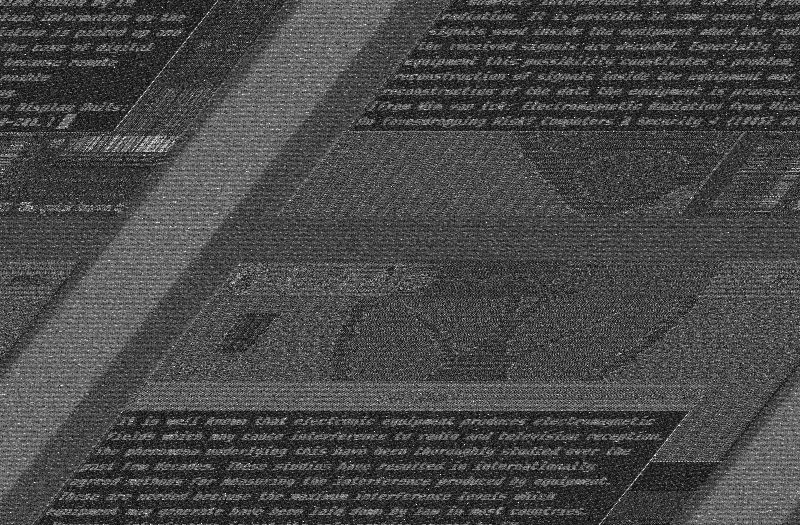

In [17]:
let
	riq = resample(abs.(data), Fs, Fp*SAMPLE_FACTOR, interp=:linear)
	frame1 = riq[1:Xt*Yt*SAMPLE_FACTOR]
	Gray.(norm1(rowify(frame1, Xt*SAMPLE_FACTOR))'*1.5)
end

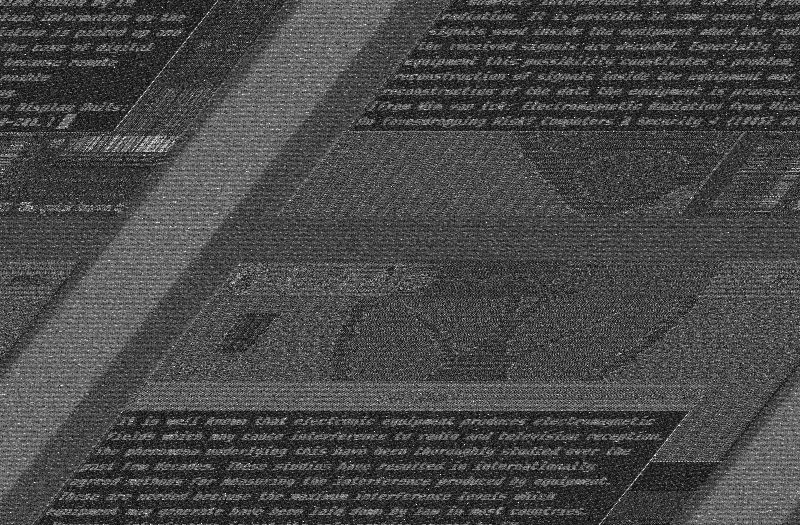

In [18]:
let
	riq = resample(abs.(data), Fs, Fp*SAMPLE_FACTOR, interp=:linear)
	frame1 = riq[1:Xt*Yt*SAMPLE_FACTOR]
	Gray.(norm1(rowify(frame1, Xt*SAMPLE_FACTOR))'*1.5)
end

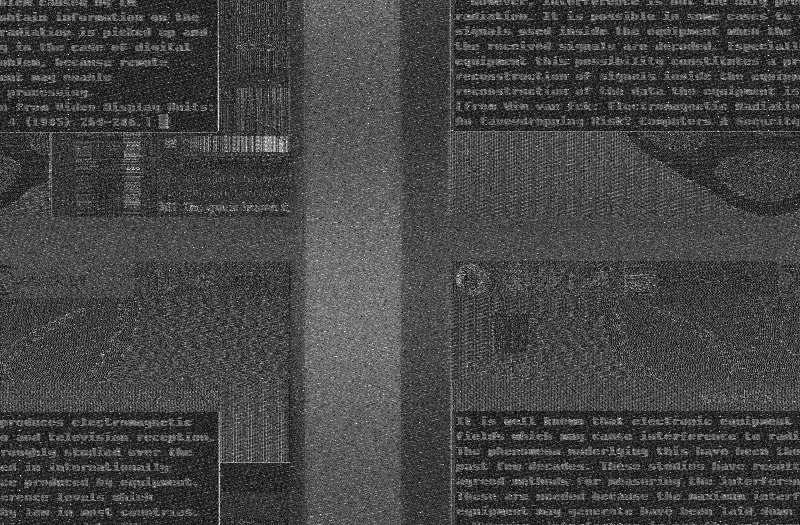

In [19]:
let
	riq = resample(abs.(data), Fs, 25_200_175*SAMPLE_FACTOR, interp=:linear)
	frame1 = riq[1:Xt*Yt*SAMPLE_FACTOR]
	Gray.(norm1(rowify(frame1, Xt*SAMPLE_FACTOR))'*1.5)
end

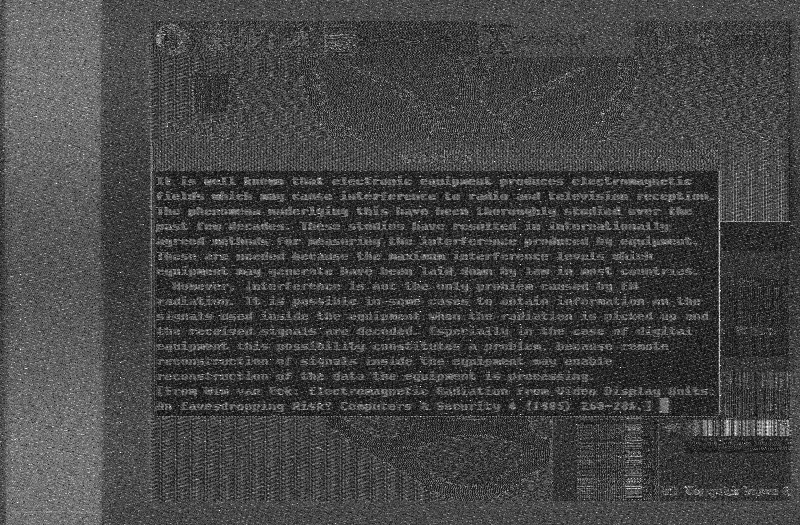

In [20]:
let
	riq = resample(abs.(data), Fs, 25_200_175*SAMPLE_FACTOR, interp=:linear)
	frame1 = riq[1+SKIP_SAMPLES:SKIP_SAMPLES+Xt*Yt*SAMPLE_FACTOR]
	Gray.(norm1(rowify(frame1, Xt*SAMPLE_FACTOR))'*1.5)
end

## Detecting Pixel Clock Automatically

In [21]:
Fp2 = trunc(Int, recoverClock2(data, [1, 100, Yt, Yt*4, Yt*16]))

1: 2033.7636544190666 uncertainty 4.0
100: 203200.0 uncertainty 100.0
525: 1.0666635e6 uncertainty 5.25
2100: 4.266652e6 uncertainty 4.0
8400: 1.70666e7 uncertainty 4.0


25200096

In [57]:
offset = let 
	sol, sof = detectBlankingIntervalsPlot(data, Fp2)
	sof*Xt + sol
end

191568

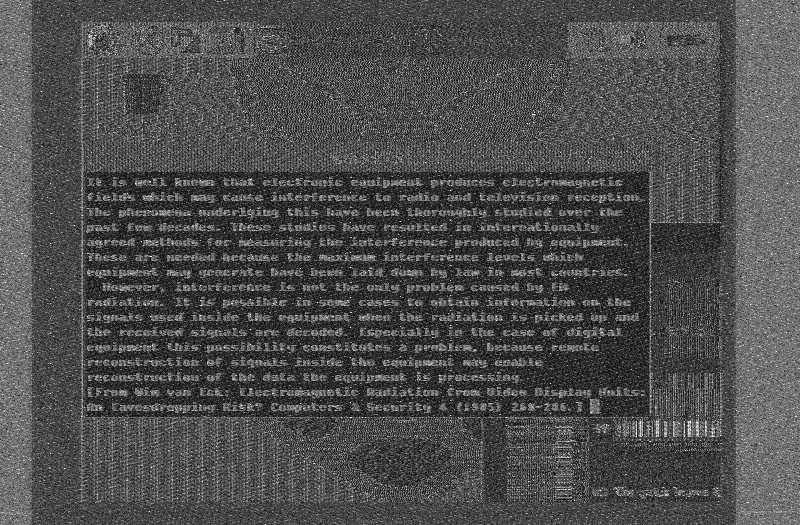

In [66]:
let
	# First frame with automatic pixel clock and offset
	riq = resample(abs.(data), Fs, Fp2, interp=:linear)
	frame1 = riq[1+offset:offset+Xt*Yt*SAMPLE_FACTOR]
#     minimum.(1, norm1(rowify(frame1, Xt*SAMPLE_FACTOR))'*1.5)
	frame1_aligned = Gray.(min.(1, norm1(rowify(frame1, Xt*SAMPLE_FACTOR))'*1.5))
    save("output/frame1_aligned.png", frame1_aligned)
    frame1_aligned
end

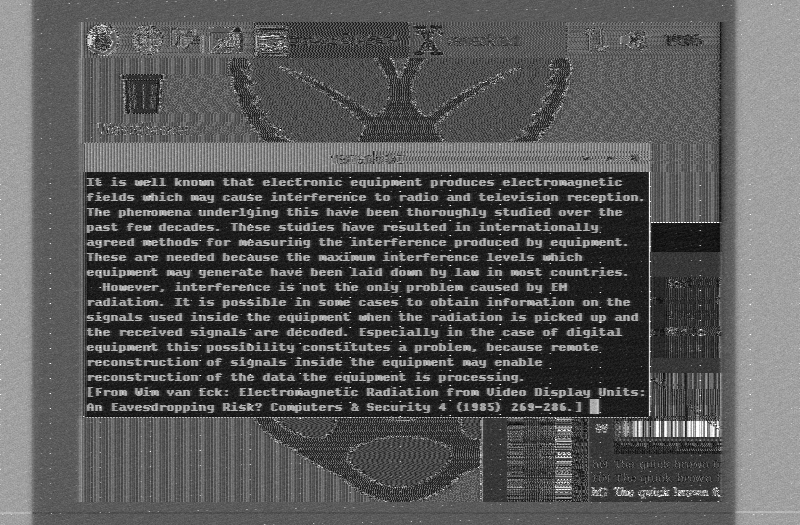

In [68]:
let
	# Average of 15 frames
	riq = resample(abs.(data), Fs, Fp2, interp=:linear)
	avgframe = coherentavg(rowify(riq[offset+1:end], Xt*SAMPLE_FACTOR)', 50)
	avgframe = Gray.(min.(1, norm1(avgframe)*1.5))
    save("output/50frame.png", avgframe)
    avgframe
end

## IQ analysis

In [69]:
peak_freq = let
	a, b=fft_freq(data, Fs)
	top_freqs, top_freq_values = topnfft(a, abs.(b), 2)
	println(top_freqs, top_freq_values)
	top_freqs[2]
end

[-2.1798451e7, 3.401646e6]Float32[872.0152, 783.7301]


3.401646e6

In [70]:
# data_unrotated = data .* exp.(1im .* -0.3339547842809451 .* range(1, length(data))) 
data_unrotated = unrotate(data, peak_freq; fs=Fs)

-0.0 - 0.33395581511603456im


64000000-element Vector{ComplexF64}:
 -0.00011691965886170933 + 3.206153677217891e-5im
    6.325496946525932e-5 + 1.559121739604729e-5im
   -3.576480154533475e-5 - 4.754739136684197e-5im
  -2.2072619559781772e-5 + 8.332812066234867e-5im
    7.797703251634789e-5 - 5.199987564840099e-5im
   -4.496753996179421e-5 - 4.359743520730309e-6im
    5.162915286116079e-5 + 7.616504543975093e-5im
  -2.4464009181544442e-5 - 7.41404672020192e-5im
   -7.479304309861005e-5 + 5.678814771958417e-5im
    7.813542747878899e-5 + 8.540889964075524e-6im
   -5.473178651147817e-5 - 8.479098298002327e-5im
  -2.5066769943352703e-6 + 3.3816758863067237e-5im
  0.00010826020080944107 - 2.7486321443181874e-5im
                         ⋮
  -2.5007568644841758e-5 - 7.677909523932244e-6im
  -1.1065759576739724e-5 - 1.4861980743579829e-5im
    2.104748718192596e-5 - 4.670112174250203e-5im
   4.1617996233094274e-5 + 1.9963195122723316e-6im
   6.4583085107897805e-6 - 6.529182203299949e-7im
  -1.5700631350667888e-5 + 1.4273

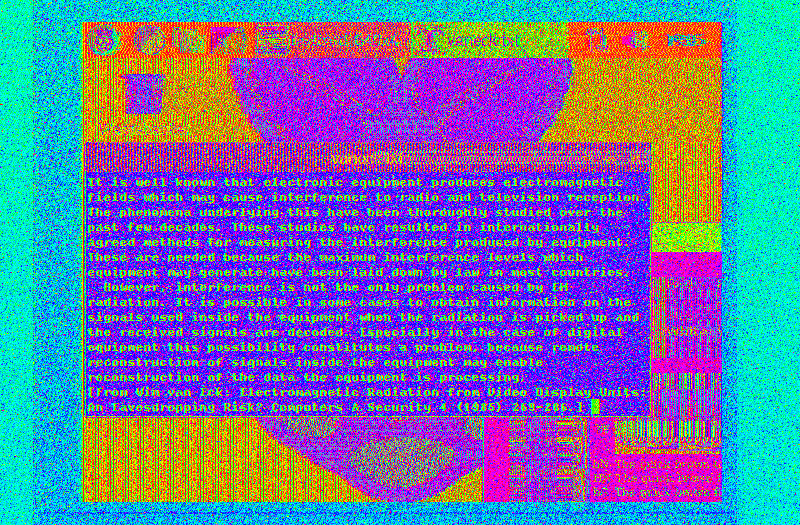

In [76]:
let
	data_mat = rowify(resample(data_unrotated, Fs, Fp2, interp=:linear)[offset:end], Xt)'
	img = HSV.(minmaxnorm(angle.(data_mat), 0, 360).+50, 1, 1)
	img = img[1:525, :]
    save("output/1frame_iq_aligned.png", RGB.(img))
    img
end

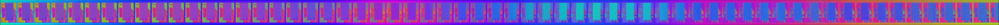

In [72]:
let
	data_mat = rowify(resample(data_unrotated, Fs, Fp2, interp=:linear)[offset:end], Xt)'
	img = HSV.(minmaxnorm(angle.(data_mat), 0, 360).+50, 1, 1)
	img'
end

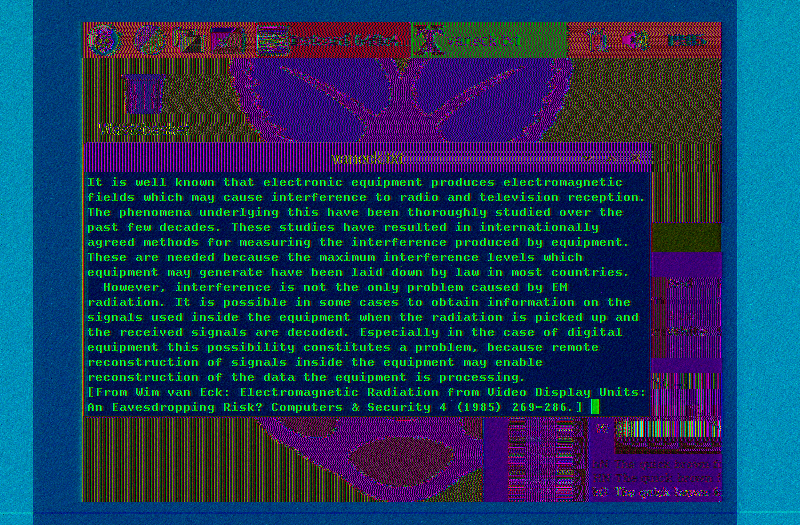

In [80]:
let
	data_mat = rowify(resample(data_unrotated[1:end], Fs, Fp2, interp=:linear)[offset:end], Xt)'
# 	data_mat = rowify(resample(data_unrotated, Fs, 25200086, interp=:linear)[offset:end], Xt)'
	data_mat = coherentavg(data_mat, 30)
	img = HSV.(minmaxnorm(angle.(data_mat), 0, 360), 1, norm1(abs.(data_mat))*2)
    save("output/iq_30frame.png", RGB.(img))
    img
end

In [74]:
function resample2(x, fs, fr; phaseOffset=0, interp=:linear)
	step = fs / fr
	indices = min.(length(x)-1, collect(1:step:length(x)) .+ phaseOffset)
	if interp == :nearest
		indices = Int.(round.(indices))
		x[indices]
	elseif interp == :linear
		i1 = trunc.(Int, indices)
		i2_w = indices .- i1
		i1_w = 1 .- i2_w
		x[i1] .* i1_w .+ x[i1.+1] .* i2_w
	else
		error("Provided interp does not exist")
	end
end

resample2 (generic function with 1 method)

In [81]:
let
    for phaseOffset in [0, 0.5, 1, 1.5, 2, 2.5]
        println(offset)
        # data_mat = rowify(resample(data_unrotated[1:end], Fs, Fp2, interp=:linear)[offset:end], Xt)'
        data_mat = rowify(resample2(data_unrotated, Fs, Fp2, phaseOffset=phaseOffset, interp=:linear)[offset:end], Xt)'
        data_mat = coherentavg(data_mat, 10)
        img = HSV.(minmaxnorm(angle.(data_mat), 0, 360), 1, norm1(abs.(data_mat))*2)
        save("output/offset_$(phaseOffset).png", RGB.(img))
    end
end

191568
191568
191568
191568
191568
191568


In [ ]:
function iqImages(freq)
	data = load_iq("./data/scene3-640x480-60-$(freq)M-64M-40M.dat")

	Fp2 = recoverClock2(data, [1, Yt, Yt*4, Yt*16])

	offset = let 
		sol, sof = detectBlankingIntervals2(data, Fp2)
		sof*Xt + sol
	end
 
    for peakId in [1]
        println(peakId)
        peak_freq = let
            a, b=fft_freq(data, Fs)
            top_freqs, top_freq_values = topnfft(a, abs.(b), 2)
            println(top_freqs, top_freq_values)
            top_freqs[peakId]
        end

        data_unrotated = unrotate(data, peak_freq; fs=Fs)

        for phaseOffset in [0, 0.5, 1, 1.5, 2, 2.5]
            println(phaseOffset)
            data_mat = rowify(resample2(data_unrotated, Fs, Fp2, phaseOffset=phaseOffset, interp=:linear)[offset:end], Xt)'
            data_mat = coherentavg(data_mat, 10)
            img = HSV.(minmaxnorm(angle.(data_mat), 0, 360), 1, norm1(abs.(data_mat))*2)
            save("iq_out/10frame_$(freq)_$(peakId)_$(phaseOffset).png", RGB.(img))
        end
    end
end

In [ ]:
for freq in [225, 250, 275, 300, 325, 350, 375, 400, 425, 450, 475]
    println(freq)
    iqImages(freq)
end

## Frequency and offset data

In [29]:
function iqSync(freq)
	data = load_iq("./data/scene3-640x480-60-$(freq)M-64M-40M.dat")

	Fp2 = recoverClock2(data, [1, Yt, Yt*4, Yt*16])

	offset = let 
		sol, sof = detectBlankingIntervals(data, Fp2)
		sof*Xt + sol
	end
 
    fp_round = Int.(round(Fp2))
    println("Frequency $(freq)M: $(fp_round)Hz, offset $(offset). $(fp_round - 25_200_000)")
    (Fs / Fp2) * offset # Number of samples offset to start of frame
end

iqSync (generic function with 1 method)

In [30]:
sampleOffsets = Dict()
for freq in [225, 250, 275, 300, 325, 350, 375, 400, 425, 450, 475]
    sampleOffsets[freq] = iqSync(freq)
end

1: 2033.7636544190666 uncertainty 4.0
525: 1.065225e6 uncertainty 525.0
2100: 4.261856e6 uncertainty 4.0
8400: 1.704744e7 uncertainty 4.0
Frequency 225M: 25228415Hz, offset 410463. 28415
1: 2033.7636544190666 uncertainty 4.0
525: 1.065225e6 uncertainty 525.0
2100: 4.259032e6 uncertainty 4.0
8400: 1.703612e7 uncertainty 4.0
Frequency 250M: 25245182Hz, offset 420119. 45182
1: 2033.7636544190666 uncertainty 4.0
525: 1.0668e6 uncertainty 525.0
2100: 4.266648e6 uncertainty 4.0
8400: 1.70666e7 uncertainty 4.0
Frequency 275M: 25200100Hz, offset 23957. 100
1: 2033.7636544190666 uncertainty 4.0
525: 1.0668e6 uncertainty 525.0
2100: 4.266648e6 uncertainty 4.0
8400: 1.70666e7 uncertainty 4.0
Frequency 300M: 25200100Hz, offset 18603. 100
1: 2033.7636544190666 uncertainty 4.0
525: 1.0668e6 uncertainty 525.0
2100: 4.266648e6 uncertainty 4.0
8400: 1.70666e7 uncertainty 4.0
Frequency 325M: 25200098Hz, offset 277288. 98
1: 2033.7636544190666 uncertainty 4.0
525: 1.0668e6 uncertainty 525.0
2100: 4.26665

In [31]:
sampleOffsets

Dict{Any, Any} with 11 entries:
  425 => 4.80427e5
  325 => 7.04221e5
  450 => 73564.2
  300 => 47245.5
  275 => 60842.9
  225 => 1.04127e6
  400 => 1.01986e6
  350 => 3.09088e5
  475 => 1.34712e5
  375 => 67377.5
  250 => 1.06506e6